## Prompt Engineering For Multi Agent Systems

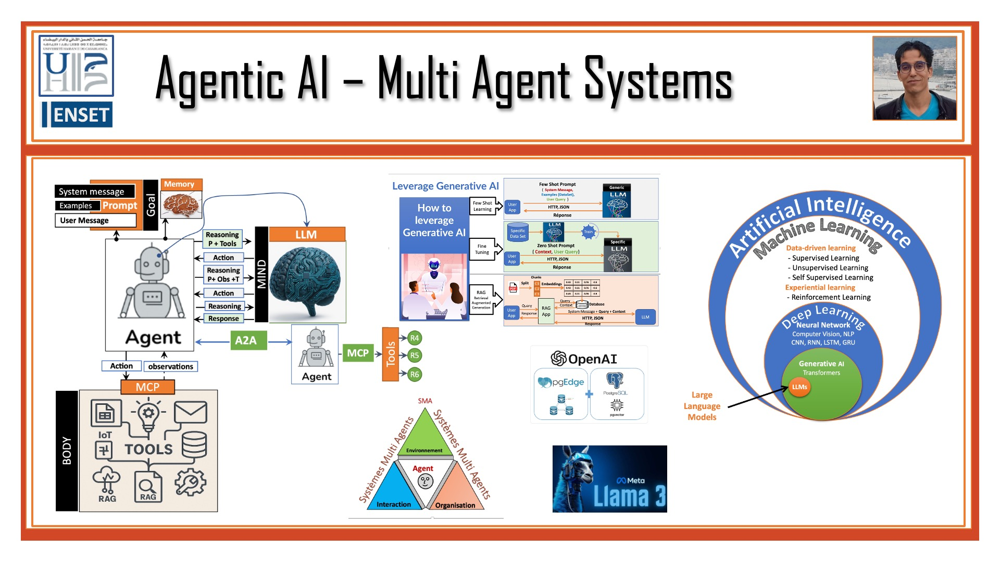

#### IA et IA Distribuée

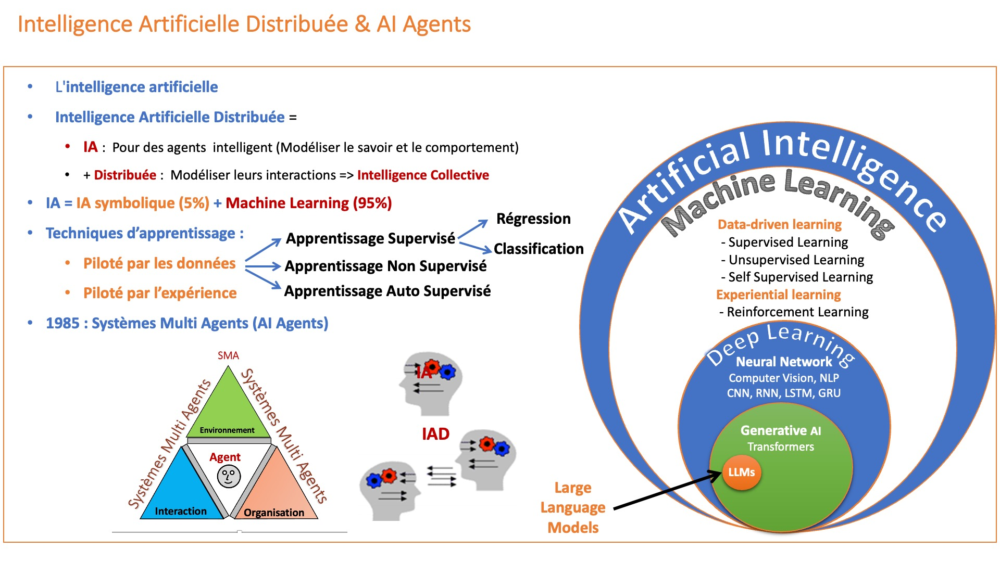

#### Apprenrentissage Par renforcement

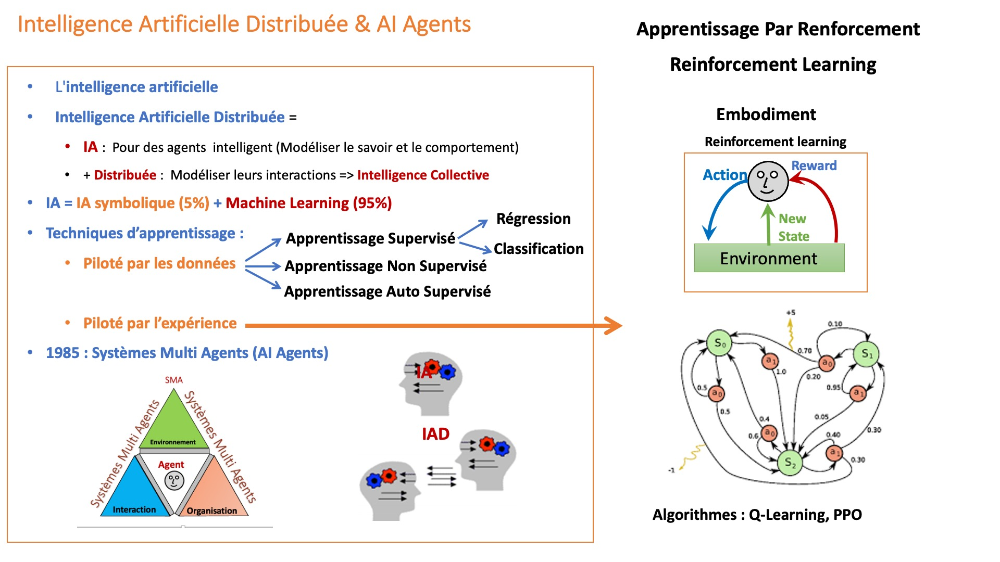

#### Ingénierie des Prompts

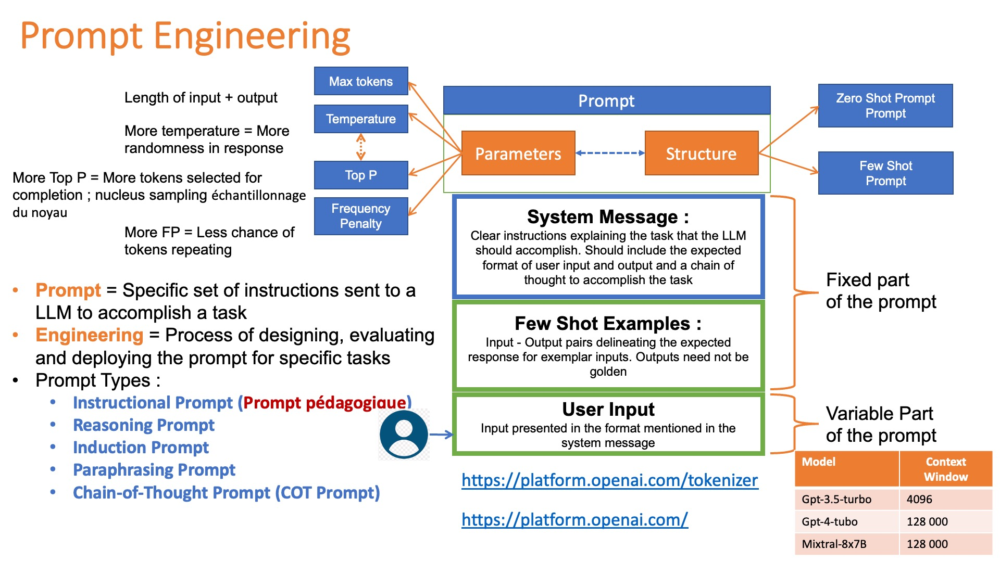

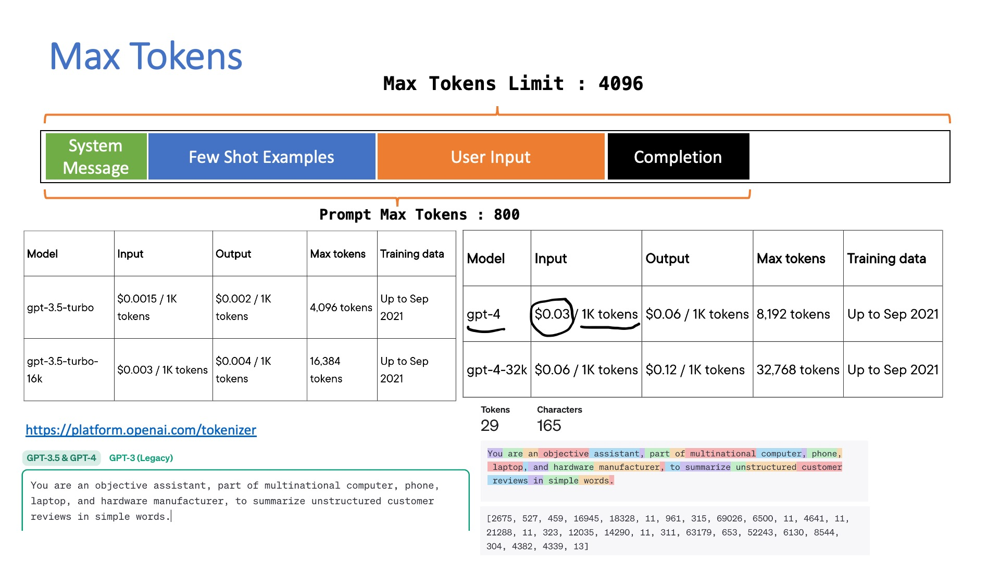

In [1]:
from langchain_openai import ChatOpenAI
from langchain.messages import SystemMessage, HumanMessage, AIMessage
from dotenv.ipython import load_dotenv
from IPython.display import Markdown
import tiktoken

In [105]:
# Charger les variables d'environnement OPENAI_API_KEY du ficher .env
load_dotenv(override=True)
# os.environ['OPENAI_API_KEY']="sk-proj-gBJaJ8...."

True

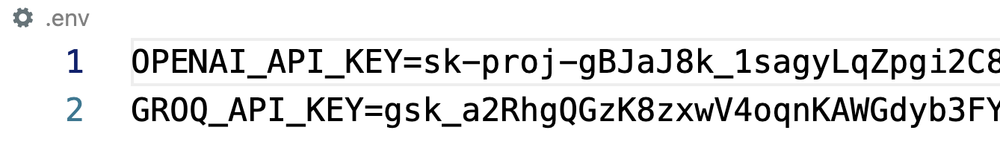

### Tokenizer avec Tiktoken

In [89]:
#encoding = tiktoken.get_encoding("cl200k_base")
encoding = tiktoken.encoding_for_model("gpt-4o")
print(encoding.name)
system_message =""" 
Perform Sentiment analysis of the review presented in the user message.
The result should be positive or negative. Do not justify your response
"""
tokens = encoding.encode(system_message)

o200k_base


In [81]:
print(len(tokens))
print(tokens)
for token in tokens:
    print(encoding.decode_single_token_bytes(token=token),end="")

28
[793, 73751, 31712, 2581, 8450, 328, 290, 3358, 13392, 306, 290, 1825, 3176, 558, 976, 1534, 1757, 413, 8841, 503, 12626, 13, 3756, 625, 14883, 634, 3322, 198]
b' \n'b'Perform'b' Sent'b'iment'b' analysis'b' of'b' the'b' review'b' presented'b' in'b' the'b' user'b' message'b'.\n'b'The'b' result'b' should'b' be'b' positive'b' or'b' negative'b'.'b' Do'b' not'b' justify'b' your'b' response'b'\n'

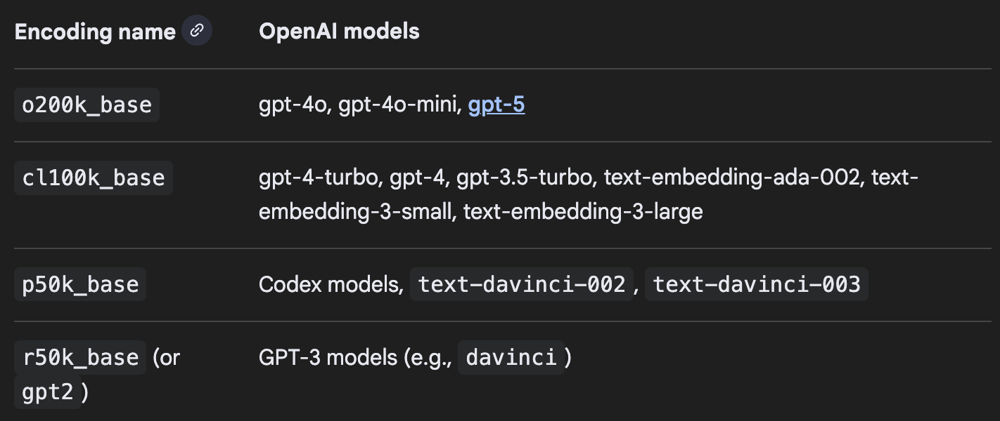

In [93]:
def num_tokens_from_string(string: str, encoding_name: str = "o200k_base") -> int:
    """Returns the number of tokens in a text string."""
    encoding = tiktoken.get_encoding(encoding_name)
    num_tokens = len(encoding.encode(string))
    return num_tokens

In [94]:
num_tokens_from_string("tiktoken is great!")

6

#### How to Prompt OpenAI LLMs

In [106]:
model = ChatOpenAI(
    model="gpt-5.2", temperature=0
    )

In [107]:
response = model.invoke([
    {"role":"system", "content":"You are a helpful assistant. The output should be in Markdown"},
    {"role":"user","content":"C'est quoi un Agent AI"}
])

In [108]:
# Même chose
response = model.invoke([
    SystemMessage("You are a helpful assistant. The output should be in Markdown"),
    HumanMessage("C'est quoi un Agent AI")]
    )

In [102]:
print(display(Markdown(response.content)))

Un **Agent AI (agent d’intelligence artificielle)** est un programme capable de **réaliser des tâches de manière autonome** en utilisant un modèle d’IA (souvent un LLM comme ChatGPT) pour **comprendre un objectif, décider des étapes, agir, puis s’adapter** selon les résultats.

## Ce qui caractérise un agent AI
- **Un objectif** : “répondre à des clients”, “planifier un voyage”, “surveiller des erreurs”, etc.
- **Autonomie** : il peut enchaîner plusieurs actions sans qu’on lui dise chaque étape.
- **Prise de décision** : il choisit quoi faire ensuite selon le contexte.
- **Boucle action → feedback** : il observe le résultat (succès/échec) et ajuste.
- **Outils** (souvent) : accès à des APIs, une base de données, un navigateur, un calendrier, l’envoi d’emails, etc.
- **Mémoire** (parfois) : il peut conserver des infos d’une interaction à l’autre (préférences, historique).

## Exemple simple
Un agent “support client” peut :
1. Lire le message d’un client  
2. Chercher dans une base de connaissances  
3. Proposer une réponse  
4. Créer un ticket si nécessaire  
5. Relancer le client si une info manque  

## Différence avec un chatbot classique
- **Chatbot** : répond surtout “au fil de la conversation”, souvent sans agir dans le monde extérieur.
- **Agent AI** : peut **planifier** et **exécuter des actions** (réserver, rechercher, classer, déclencher des workflows), parfois sur plusieurs étapes.

Si tu me dis ce que tu veux faire (ex : automatiser des emails, analyser des documents, gérer un support, etc.), je peux te proposer un exemple d’agent adapté.

None


### Interact with OpenAI LLMs using any Http Client (Postman)

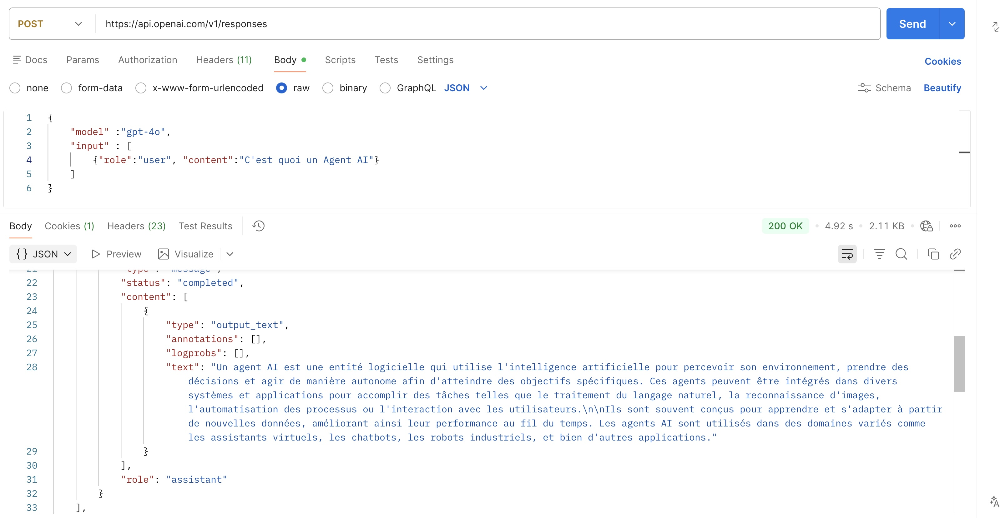

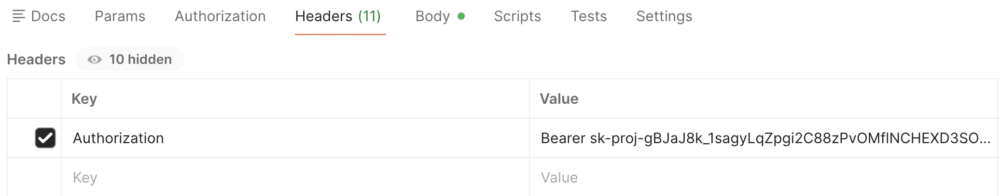

### How to Prompt Local Ollama LLMs

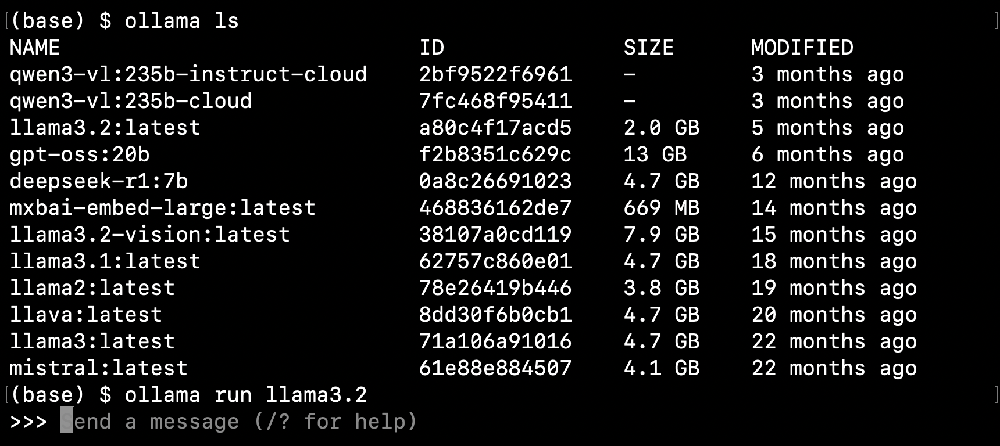

In [109]:
from langchain_ollama import ChatOllama

In [110]:
llm = ChatOllama(model="llama3.2")

In [112]:
response = llm.invoke([
    SystemMessage("You are a helpful assistant. The output should be in Markdown"),
    HumanMessage("C'est quoi un Agent AI")
])

In [113]:
print(display(Markdown(response.content)))

**Qu'est-ce qu'un Agent AI ?**

Un **Agent AI** (ou Intelligence Artificielle) est une entité artificielle qui peut interagir avec son environnement, prendre des décisions et adapter ses comportements en fonction de l'information disponible. Cet agent utilise la connaissance et les compétences pour atteindre des objectifs spécifiques.

**Caractéristiques d'un Agent AI**

Voici quelques-unes des caractéristiques clés d'un agent AI :

*   **Conscience**: Un agent AI a une conscience de son état interne, ce qui lui permet de prendre des décisions éclairées.
*   **Objectif** : Un agent AI a un objectif ou un cible à atteindre, qu'il peut modifier en fonction des informations qu'il reçoit.
*   **Environnement**: Un agent AI est capable d'interagir avec son environnement et de recevoir des informations à partir de sources extérieures.
*   **Adaptabilité** : Un agent AI est adaptable pour s'adapter aux changements de son environnement.

**Exemples d'agents AI**

Voici quelques exemples d'agents AI :

*   **Chatbots**: Les chatbots utilisent l'intelligence artificielle pour simuler des conversations et répondre aux questions.
*   **Véhicules autonomes**: Les véhicules autonomes sont équipés d'un agent AI qui permet de prendre des décisions en temps réel sur la route.
*   **Robotiques**: Les robots utilisent l'intelligence artificielle pour effectuer des tâches telles que la manipulation d'objets.

**Avantages et limites**

Les agents AI offrent plusieurs avantages, notamment :

*   **Amélioration de la précision** : Les agents AI peuvent prendre des décisions plus précises et éclairées.
*   **Augmentation de l'efficacité** : Les agents AI peuvent automatiser certaines tâches pour augmenter l'efficacité.

Les limites des agents AI incluent :

*   **Complexité** : Les agents AI sont souvent complexes et difficiles à comprendre.
*   **Faiblesses** : Les agents AI peuvent être vulnérables à certaines formes de faiblesse, telles que la manipulation par les humains.

En résumé, les agents AI sont des entités artificielles qui peuvent interagir avec leur environnement et prendre des décisions éclairées. Ils offrent plusieurs avantages, notamment l'amélioration de la précision et l'augmentation de l'efficacité, mais ils peuvent également présenter certaines limites telles que la complexité et les faiblesses.

None


### Interact with Ollama LLMs using any Http Client (Postman)

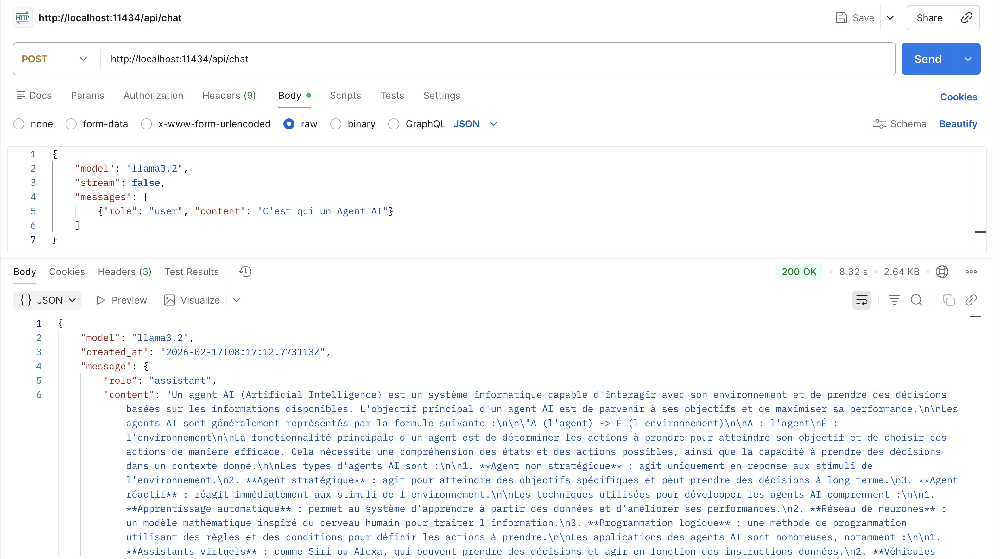

### How To Prompt Groq LLMs

In [114]:
# Charger la variable d'environnement GROQ_API_KEY du fichier .env
load_dotenv(override=True)

True

In [115]:
from langchain_groq import ChatGroq

In [116]:
llm3 = ChatGroq(model="openai/gpt-oss-120b")

In [117]:
resp3 = llm.invoke([
    SystemMessage("You are a helpful assistant. The output should be in Markdown"),
    HumanMessage("C'est quoi un Agent AI")
])

In [118]:
print(display(Markdown(resp3.content)))

**Qu'est-ce qu'un agent AI ?**

Un agent AI (Agent Artificiel Intelligence) est un système informatique capable de simuler la raison et de prendre des décisions autonomes, à la manière d'un humain. Il est conçu pour résoudre des problèmes complexes, prendre des actions dans un environnement dynamique et apprendre du processus.

**Caractéristiques d'un agent AI**

Un agent AI possède les caractéristiques suivantes :

*   **Sensibilité**: L'agent perçoit l'environnement à travers des sens, comme la perception sensorielle ou la lecture de données.
*   **Raisonement**: L'agent utilise des règles et des algorithmes pour prendre des décisions et résoudre les problèmes.
*   **Actionnalité**: L'agent prend des actions dans l'environnement, comme bouger un robot ou envoyer une requête à un serveur.
*   **Apprentissage**: L'agent apprend à partir d'expériences, de données et de feedback.

**Types d'agents AI**

Il existe plusieurs types d'agents AI :

1.  **Agent réactif (Reactive Agent)** : L'agent réagit aux événements et aux stimuli sans prendre de décision préalable.
2.  **Agent délibéré (Deliberative Agent)** : L'agent prend des décisions après avoir analysé les informations disponibles.
3.  **Agent d'apprentissage automatique (Learning Agent)** : L'agent apprend à partir d'expériences et de données.

**Applications de l'intelligence artificielle**

Les agents AI sont utilisés dans divers domaines, tels que :

*   **Assistants virtuels**
*   **Systèmes de recommandation**
*   **Autopilotes**
*   **Droit des affaires et des contrats**

None


#### Exemple de Prompt : Aspect Based Sentiment Analysis

In [119]:
system_message = """
Effectuez une analyse de sentiments basée sur les aspects des avis concernant les ordinateurs portables présentés en entrée.
Chaque avis peut comporter un ou plusieurs des aspects suivants : screen, keybloard et pad.
Pour chaque avis présenté en entrée :
- Identifiez la présence d'au moins un des trois aspects (screen, keybloard, pad).
- Attribuez une polarité de sentiment (positive, negative ou neutral) à chaque aspect. Organisez votre réponse dans un objet JSON avec les en-têtes suivants :
  - category:[liste des aspects]
  - polarity:[liste des polarités correspondantes pour chaque aspect]
Si l'un des aspects n'est pas présent dans l'avis de l'utilisateur, tu supposes que la polarité est neutre 
"""

In [120]:
zeroshot_prompt = [
  {"role": "system", "content": system_message},
  {"role": "user", "content": """
       L'écran est très bon, mais je n'ai pas aimé la souris. le clavier Ma fih Maytchaf
       """}
]

In [121]:
llm = ChatOpenAI(model="gpt-5.2")
resp = llm.invoke(input=zeroshot_prompt)

In [122]:
print(resp.content)

```json
{
  "category": ["screen", "keybloard", "pad"],
  "polarity": ["positive", "neutral", "negative"]
}
```


In [123]:
resp_text_json = resp.content.replace("```json","").replace("```","")

In [124]:
print (resp_text_json)


{
  "category": ["screen", "keybloard", "pad"],
  "polarity": ["positive", "neutral", "negative"]
}



In [125]:
import json

In [126]:
result = json.loads(resp_text_json)

In [127]:
type(result)

dict

In [128]:
result

{'category': ['screen', 'keybloard', 'pad'],
 'polarity': ['positive', 'neutral', 'negative']}

In [129]:
print(result['category'])

['screen', 'keybloard', 'pad']


In [130]:
print(result['polarity'][0])

positive


### Multi Modal LLMs
#### Image Generation Prompting

In [131]:
llm4 = ChatOpenAI(model="gpt-5.2")
llm_with_tools = llm4.bind_tools([
    {"type":"image_generation", "quality":"high"}
    ])

In [134]:
resp4 = llm_with_tools.invoke(input=[
    HumanMessage("Je veux une photo d'un chat qui code du java")
])


In [135]:
from IPython.display import Image
import base64

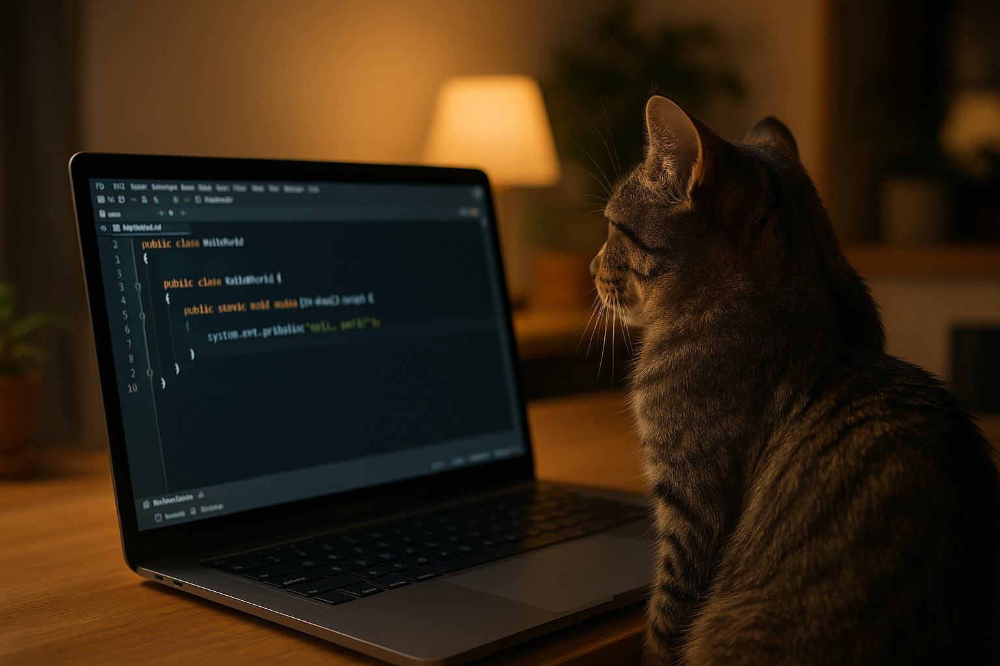

In [136]:
Image(base64.b64decode(resp4.content_blocks[0]['base64']))

#### Image Description

In [137]:
path ="rag.png"

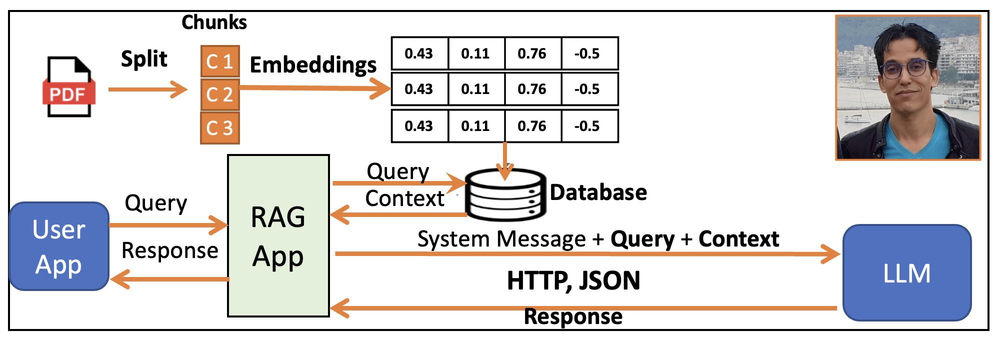

In [138]:
Image(path)

# Description des images

In [139]:
llm5 = ChatOpenAI(model="gpt-5.2")

In [140]:
# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

In [141]:
img = encode_image(path)

In [142]:
resp5 = llm5.invoke(input=[
    HumanMessage(content=[
        {"type":"text","text":"Qu'est ce que tu vois dans cette image"},
        {"type":"image_url", "image_url": {"url": f"data:image/png;base64,{img}"}}
    ])])

In [143]:
print(display(Markdown(resp5.content)))

C’est un schéma qui illustre le fonctionnement d’une application **RAG (Retrieval-Augmented Generation)** :

- Un **PDF** est **découpé (Split)** en **morceaux (Chunks C1, C2, C3)**.  
- Chaque chunk est transformé en **embeddings** (vecteurs numériques) puis stocké dans une **base de données** (type base vectorielle).  
- L’**utilisateur** envoie une **requête** via une **User App** vers la **RAG App**.  
- La RAG App interroge la base pour récupérer le **contexte pertinent** (Query Context).  
- Elle envoie au **LLM** un message composé de **System message + Query + Context** (via **HTTP/JSON**).  
- Le **LLM** renvoie une **réponse**, qui repart vers l’utilisateur.

En haut à droite, il y a aussi la **photo d’une personne** (je ne peux pas l’identifier).

None


## Use Case : Sentiment Analysis

### Step 1: Define objectives & metrics

Dans l’analyse de sentiment, nous attribuons au texte fourni en entrée l’une des deux étiquettes suivantes : **positif** ou **négatif** (dans certains cas, l’une des trois étiquettes : **positif**, **négatif** ou **neutre**). À titre d’exemple, nous allons attribuer un sentiment aux avis clients sur des produits répertoriés dans la catégorie **habillement** sur Amazon.

Étant donné que notre prédiction correspondra à l’une des deux étiquettes — **positif** ou **négatif** — nous pouvons utiliser les métriques suivantes pour mesurer la performance d’un prompt :

- **Taux d’exactitude (accuracy)** : calculé comme le nombre de prédictions correctes (c’est-à-dire le nombre de fois où la prédiction correspond à la vérité terrain / étiquette de référence).

- **Score micro-F1** : calculé en agrégeant les **vrais positifs (TP)**, **faux négatifs (FN)** et **faux positifs (FP)** sur l’ensemble des classes. Cette métrique est utilisée lorsque nous ne soupçonnons pas de déséquilibre de classes (par exemple, si nous nous attendons à ce qu’il n’y ait pas une quantité écrasante d’avis positifs ou négatifs).

En pratique, il est préférable d’utiliser une métrique nuancée telle que le **micro-F1** plutôt que la simple **accuracy**.

Pour illustrer le calcul du score **micro-F1** dans un scénario à deux classes, nous pouvons utiliser une **matrice de confusion**. Une matrice de confusion est un tableau qui indique le nombre de **vrais positifs (TP)**, **faux positifs (FP)**, **vrais négatifs (TN)** et **faux négatifs (FN)** pour un problème de classification binaire.

Voici un exemple de matrice de confusion pour un scénario à deux classes :

| Prédit/Réel | Positif | Négatif |
| ----------- | ------- | ------- |
| Positif     | 50      | 10      |
| Négatif     | 5       | 100     |

Pour calculer le score **micro-F1**, nous commençons par calculer le nombre total de **vrais positifs**, **faux positifs** et **faux négatifs** sur les deux classes :

- Total des vrais positifs = 50
- Total des faux positifs = 10
- Total des faux négatifs = 5

Ensuite, nous pouvons calculer la **précision**, le **rappel** et le **score F1** pour la moyenne micro :

- **Micro-précision** = Total des vrais positifs / (Total des vrais positifs + Total des faux positifs) = 50 / (50 + 10) = 0,833
- **Micro-recall** = Total des vrais positifs / (Total des vrais positifs + Total des faux négatifs) = 50 / (50 + 5) = 0,909
- **micro-F1 Score** = 2 * (Micro-précision * Micro-rappel) / (Micro-précision + Micro-rappel) = 2 * (0,833 * 0,909) / (0,833 + 0,909) = 0,870

Par conséquent, le score **micro-F1** pour cet exemple est **0,870**.

Nous utiliserons l’implémentation `f1_score` de `scikit-learn` pour évaluer les prompts d’analyse de sentiment dans ce notebook.

### Step 2: Assemble Data

In [6]:
import session_info
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
import numpy as np
from datasets import load_dataset
from dotenv.ipython import load_dotenv
import session_info
import matplotlib.pyplot  as plt


In [7]:
load_dotenv(override=True)

True

In [8]:
session_info.show()

Pour l’exercice d’analyse de sentiment, nous utiliserons un jeu de données d’avis de films [collectés (scrapés) depuis IMDB](https://huggingface.co/datasets/imdb). Notre étude se concentrera sur l’attribution d’un sentiment **positif** ou **négatif** aux avis de films que les utilisateurs ont publiés sur IMDB. Lors de l’ingénierie de prompts, nous utiliserons un **jeu de données de validation** (hold-out) d’avis (c’est-à-dire des **exemples de référence / gold examples**) afin d’évaluer la qualité de l’attribution du sentiment.

In [9]:
corpus = load_dataset("imdb")

In [10]:
corpus

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 25000
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 25000
    })
    unsupervised: Dataset({
        features: ['text', 'label'],
        num_rows: 50000
    })
})

Notez que le jeu de données est déjà divisé en trois sous-ensembles : **train**, **test** et **unsupervised** (c’est-à-dire sans étiquette). Les jeux de données d’apprentissage automatique sont généralement stockés de cette manière ; toutefois, nous n’avons pas l’intention d’entraîner un classifieur de sentiment à partir de zéro, nous nous concentrons donc uniquement sur les données d’entraînement.

Lorsque nous constituons un jeu de données destiné à être utilisé avec un **LLM**, nous créons des partitions pour les **exemples** et les **exemples de référence (gold examples)**, puis nous enregistrons ces versions pour de futures itérations. Voyons comment ce processus est appliqué au sous-ensemble `train` des données. Pour faciliter la préparation des données, convertissons `train` en **DataFrames**.

In [20]:
train_df = corpus['train'].to_pandas()

In [21]:
train_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   text    25000 non-null  str  
 1   label   25000 non-null  int64
dtypes: int64(1), str(1)
memory usage: 32.0 MB


In [22]:
train_df.label.value_counts()

label
0    12500
1    12500
Name: count, dtype: int64

Remarquez que le jeu de données est parfaitement équilibré, avec un nombre égal d’avis associés au sentiment **positif** (label 1) et au sentiment **négatif** (label 0).

Afin de faciliter la comparaison des étiquettes de référence (ground truth) avec les prédictions du modèle, ajoutons l’étiquette textuelle correspondante comme colonne supplémentaire dans les données.

In [23]:
train_df['sentiment'] = np.where(train_df.label == 1, "positive", "negative")

In [24]:
train_df.sample(6)

,text,label,sentiment
2845,The title above is used to introduce the film ...,0,negative
15671,By the end of the first hour my jaw was nestle...,1,positive
18466,"After seeing the ""Batman Dead End"" short, I di...",1,positive
3086,This movie was just heckled by MST3K and with ...,0,negative
7595,I so wanted to believe in this movie after the...,0,negative
6827,"OK, admittedly as an Orthodox woman who LIVES ...",0,negative


Nous disposons désormais du jeu de données au format adéquat pour être traité par un LLM.

In [25]:
train_df.sentiment.value_counts()

sentiment
negative    12500
positive    12500
Name: count, dtype: int64

<Axes: >

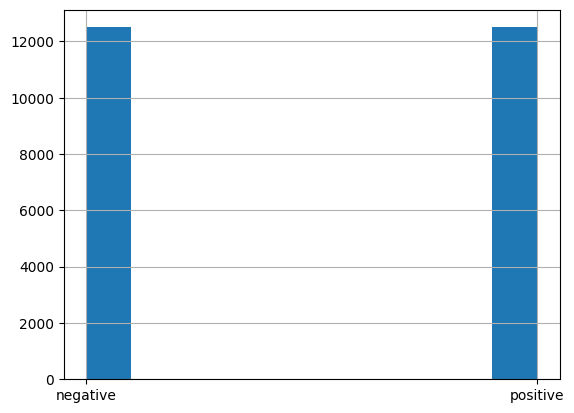

In [26]:
train_df.sentiment.hist()

Maintenant que le prétraitement est terminé, divisons les données en deux segments : un segment constituant un réservoir dans lequel puiser des exemples *few-shot*, et un autre segment constituant un réservoir d’exemples de référence (*gold examples*).

En résumé (voir la figure ci-dessous), nous extrayons un jeu de données à partir d’un corpus en traitant les champs requis. Chaque exemple doit contenir le texte d’entrée et une étiquette annotée. Une fois que nous avons créé des exemples et des exemples de référence (*gold examples*) à partir de ce jeu de données, cet ensemble de données curé est enregistré dans un format adapté à la réutilisation (par exemple, JSON).

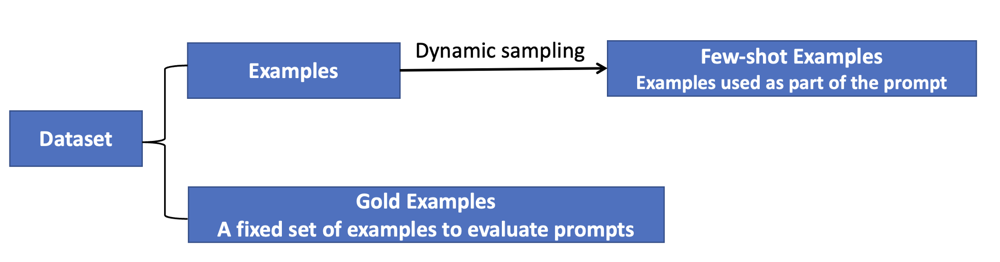

In [27]:
examples_df, gold_examples_df = train_test_split(
    train_df, test_size=0.2, random_state=42 
)

In [28]:
(examples_df.shape, gold_examples_df.shape)

((20000, 3), (5000, 3))

Pour sélectionner des exemples de référence (*gold examples*) pour cette session, nous effectuons un échantillonnage aléatoire à partir des données de test en utilisant `random_state=42`. Cela garantit que les exemples obtenus lors de plusieurs exécutions de l’échantillonnage sont identiques (c’est-à-dire qu’ils sont sélectionnés aléatoirement, mais ne changent pas d’une exécution à l’autre du notebook). Notez que nous faisons cela uniquement pour maintenir des temps d’exécution faibles à des fins d’illustration. En pratique, un grand nombre d’exemples de référence permet d’obtenir des estimations plus robustes de la précision du modèle.

In [29]:
columns= ['text', 'sentiment']
gold_examples = ( 
    gold_examples_df.loc[:, columns]
    .sample(20, random_state=42)
    .to_json(orient='records'))

In [167]:
json.loads(gold_examples)[0]

{'text': 'Like I said at the top, four stars just aren\'t enough. It\'s one of the best films I\'ve ever seen in my almost 17 years of life. For the people that don\'t really like it or understand it, you must not have a real appreciation for art or you might have a short attention span.<br /><br />Even if I haven\'t seen all his films yet, I\'d have to say that this is Spielberg at his peak. It\'s pretty sad to see that movies as great as "The Color Purple" don\'t come along too often \'cause I think all of us are in desperate need of first-class motion picture entertainment in these hard times.<br /><br />Movies like this are more than just movies; they\'re pieces of art that need to be appreciated more.<br /><br />The idea that it was nominated for 11 Oscars (even Best Picture of the Year) and didn\'t get one trophy is a sign of how blind and stupid Hollywood can be sometimes. Spielberg wasn\'t even nominated for Best Director! It should have swept the Oscars that year.<br /><br />T

### Étape 3 : Élaborer le prompt

#### Créer le Prompt

In [169]:
user_message_template = """```{movie_review}```"""

**Prompt 1: Zero-shot**

In [170]:
zero_shot_system_message = """
Classify the sentiment of movie reviews presented in the input as 'positive' or 'negative'
Movie reviews will be delimited by triple backticks in the input.
Answer only 'positive' or 'negative' 
Do not explain your answer.
"""

In [171]:
zero_shot_prompt = [{'role':'system', 'content': zero_shot_system_message}]

**Prompt 2: Few-shot**

Pour le prompt *few-shot*, le message système ne change pas par rapport au prompt *zero-shot*. En revanche, nous enrichissons ce message système avec des exemples *few-shot*.

In [172]:
few_shot_system_message = """
Classify the sentiment of movie reviews presented in the input as 'positive' or 'negative'
Movie reviews will be delimited by triple backticks in the input.
Answer only 'positive' or 'negative'
Do not explain your answer.
"""

Pour constituer des exemples *few-shot*, nous devons échantillonner le nombre d’avis requis à partir des données d’entraînement. Une approche consiste à commencer par isoler les avis positifs et négatifs, puis à sélectionner des échantillons dans ces sous-ensembles, comme suit (remarquez que nous constituons 8 exemples *few-shot* dans le code ci-dessous) :

In [173]:
positive_reviews = (examples_df.sentiment == 'positive')
negative_reviews = (examples_df.sentiment == 'negative')

In [174]:
(positive_reviews.shape, negative_reviews.shape)

((20000,), (20000,))

In [176]:
columns = ['text', 'sentiment']
positive_examples = examples_df.loc[positive_reviews, columns].sample(4)
negative_examples = examples_df.loc[negative_reviews, columns].sample(4)

In [177]:
positive_examples

,text,sentiment
12746,After some of the negative reviews i heard on ...,positive
12756,This film captured my heart from the very begi...,positive
18841,"This movie (and yes, it's a movie - it was sho...",positive
14640,This film was an interesting take by Hollywood...,positive


In [178]:
negative_examples

,text,sentiment
6844,Feh. This movie started out in an interesting ...,negative
158,"SPOILER: The young lover, Jed, is kicked out b...",negative
2801,Singleton has some serious issues he has to co...,negative
11716,This 2003 made for TV movie was shown on a wom...,negative


Cependant, le simple fait de sélectionner des échantillons aléatoires à partir des sous-ensembles de polarité ne suffit pas, car les exemples inclus dans un prompt sont sujets à un ensemble de biais connus, tels que :
- **Biais de l’étiquette majoritaire** (réponses les plus fréquentes dans les prédictions)
- **Biais de récence** (exemples situés vers la fin du prompt)

Pour éviter ces biais, il est important de disposer d’un ensemble d’exemples équilibré et organisé dans un ordre aléatoire. Créons une fonction Python qui génère des exemples sans biais (notre fonction implémente le flux de travail présenté ci-dessous) :

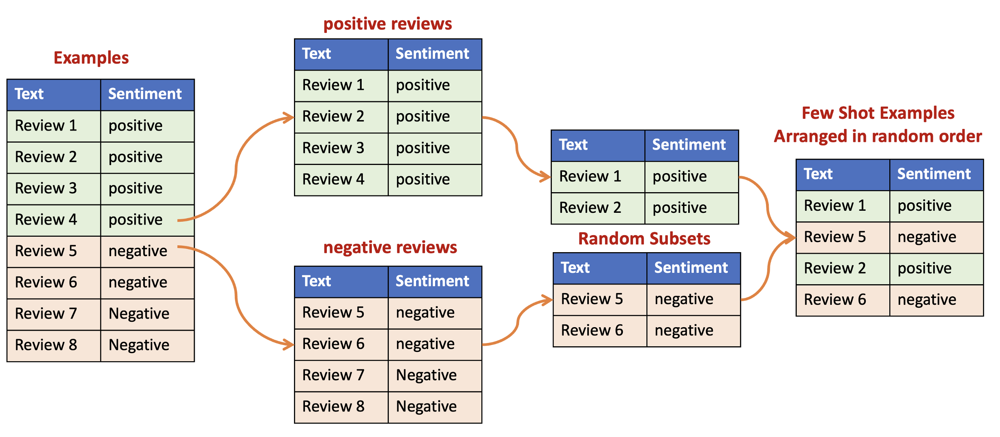

![](url(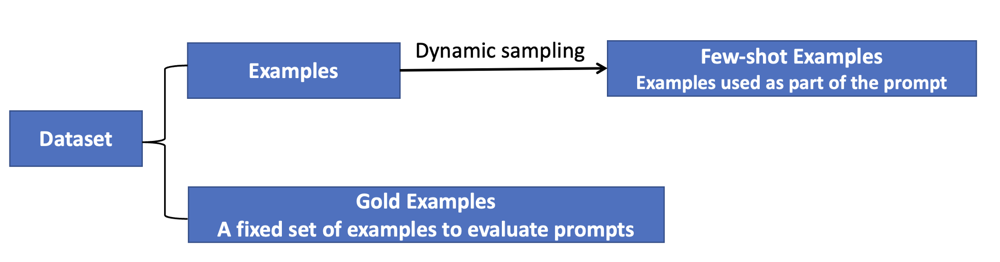))

In [179]:
def create_examples(dataset, n=4):
    positive_reviews = (dataset.sentiment == 'positive')
    negative_reviews = (dataset.sentiment == 'negative')
    columns_to_select = ['text', 'sentiment']
    positive_examples = dataset.loc[positive_reviews, columns_to_select].sample(n)
    negative_examples = dataset.loc[negative_reviews, columns_to_select].sample(n)
    examples = pd.concat([positive_examples, negative_examples])
    # sampling without replacement is equivalent to random shuffling
    randomized_examples = examples.sample(2*n, replace=False)
    return randomized_examples.to_json(orient='records')

In [180]:
examples = create_examples(examples_df, 2)

In [181]:
json.loads(examples)

[{'text': 'Otto Preminger, completing a noir cycle at Twentieth Century Fox, reunited his "Laura" leads for this stark, gritty detective drama. Dana Andrews again portrays a cop, but this time he\'s hardened, cynical and has been accused of police brutality by his superior - "You don\'t hate hoods, you liked to beat them up!". Mark Dixon (Andrews) despises criminals, as his own father was a crook. He doesn\'t want to be "Sandy Dixon\'s kid" so he became a policeman, but his methods are harsh and hated.<br /><br />One night, investigating a murder, he unknowingly punches a suspect, Ken Paine (Craig Stevens) so hard that it kills him. A shaken Dixon does his best to cover it up, intending to frame a hated thug, Scalise (Gary Merrill) for the crime. However, the blame falls on Paine\'s father-in-law, Jiggs Taylor (Tom Tully), whose daughter, department store model Morgan Taylor (Tierney) is estranged from her husband but keeps getting drawn into his gambling schemes. Paine had slapped his

Une fois les exemples en place, nous pouvons désormais assembler un prompt *few-shot*. Comme nous utiliserons ce prompt *few-shot* à plusieurs reprises lors de l’évaluation, écrivons une fonction pour créer un prompt *few-shot* (la logique de cette fonction est illustrée ci-dessous).

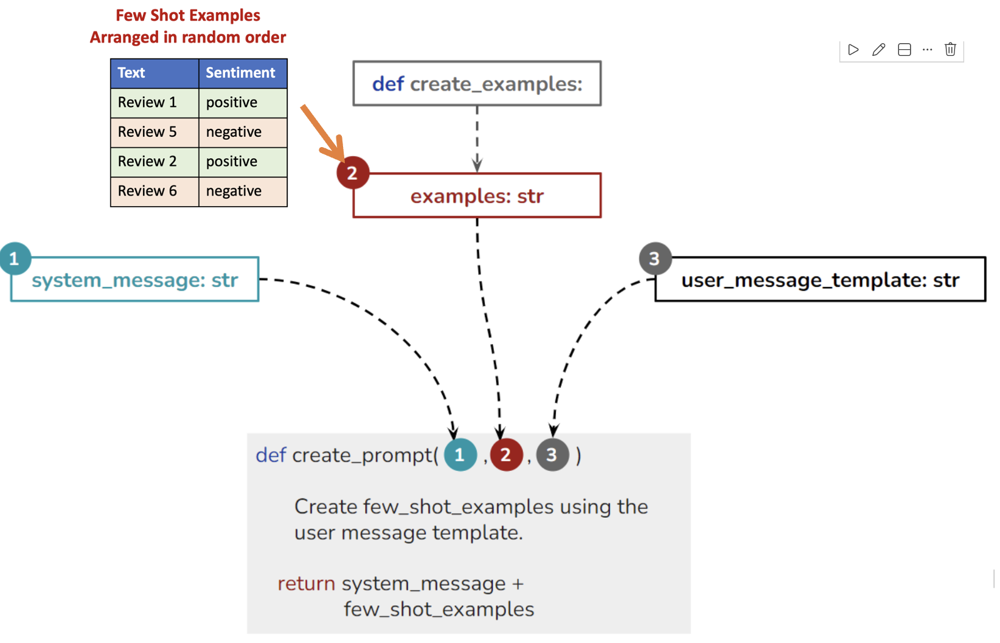

In [182]:
def create_prompt(system_message, examples, user_message_template):
    few_shot_prompt = [{'role':'system', 'content': system_message}]
    for example in json.loads(examples):
        example_review = example['text']
        example_sentiment = example['sentiment']
        few_shot_prompt.append(
            {
                'role': 'user',
                'content': user_message_template.format(
                    movie_review=example_review
                )
            }
        )
        few_shot_prompt.append(
            {'role': 'assistant', 'content': f"{example_sentiment}"}
        )
    return few_shot_prompt

In [183]:
few_shot_prompt = create_prompt(
    few_shot_system_message,
    examples,
    user_message_template
)

In [184]:
few_shot_prompt

[{'role': 'system',
  'content': "\nClassify the sentiment of movie reviews presented in the input as 'positive' or 'negative'\nMovie reviews will be delimited by triple backticks in the input.\nAnswer only 'positive' or 'negative'\nDo not explain your answer.\n"},
 {'role': 'user',
  'content': '```Otto Preminger, completing a noir cycle at Twentieth Century Fox, reunited his "Laura" leads for this stark, gritty detective drama. Dana Andrews again portrays a cop, but this time he\'s hardened, cynical and has been accused of police brutality by his superior - "You don\'t hate hoods, you liked to beat them up!". Mark Dixon (Andrews) despises criminals, as his own father was a crook. He doesn\'t want to be "Sandy Dixon\'s kid" so he became a policeman, but his methods are harsh and hated.<br /><br />One night, investigating a murder, he unknowingly punches a suspect, Ken Paine (Craig Stevens) so hard that it kills him. A shaken Dixon does his best to cover it up, intending to frame a hat

**Prompt 3: Chain-of-Thought**

Pour le prompt **CoT** (*Chain-of-Thought*), nous ajoutons des instructions détaillées étape par étape au message système *few-shot*, en demandant au modèle de réfléchir soigneusement avant d’attribuer un sentiment. Mis à part cet ajout, il n’y a pas d’autres changements par rapport au prompt *few-shot*.

In [185]:
cot_system_message = """
Classify the sentiment of movie reviews presented in the input as 'positive' or 'negative'
Movie reviews will be delimited by triple backticks ``` in the input.
Answer only 'positive' or 'negative' 
Do not explain your answer.

Instructions:
1. Carefully read the text of the review and think through the options for sentiment provided
2. Consider the overall sentiment of the review and estimate the probability of the review being positive

To reiterate, your answer should strictly only contain the label: positive or negative
"""

In [186]:
cot_few_shot_prompt = create_prompt(cot_system_message, examples, user_message_template)

In [187]:
cot_few_shot_prompt

[{'role': 'system',
  'content': "\nClassify the sentiment of movie reviews presented in the input as 'positive' or 'negative'\nMovie reviews will be delimited by triple backticks ``` in the input.\nAnswer only 'positive' or 'negative' \nDo not explain your answer.\n\nInstructions:\n1. Carefully read the text of the review and think through the options for sentiment provided\n2. Consider the overall sentiment of the review and estimate the probability of the review being positive\n\nTo reiterate, your answer should strictly only contain the label: positive or negative\n"},
 {'role': 'user',
  'content': '```Otto Preminger, completing a noir cycle at Twentieth Century Fox, reunited his "Laura" leads for this stark, gritty detective drama. Dana Andrews again portrays a cop, but this time he\'s hardened, cynical and has been accused of police brutality by his superior - "You don\'t hate hoods, you liked to beat them up!". Mark Dixon (Andrews) despises criminals, as his own father was a cr

Notez que les exemples restent les mêmes tandis que le message système change.

### Step 4 : Evaluate Prompts

Nous avons maintenant trois ensembles de prompts à évaluer à l’aide des étiquettes de référence (*gold labels*). Étant donné que le prompt *few-shot* et le prompt **CoT** dépendent de l’échantillon d’exemples tiré pour constituer le prompt, nous nous attendons à une certaine variabilité dans l’évaluation. Nous évaluons donc chaque prompt plusieurs fois afin d’avoir une idée de la moyenne et de la variation autour de cette moyenne.

Pour le redire, le choix d’un prompt doit tenir compte de la variabilité due au tirage aléatoire de l’échantillon. Pour faciliter les évaluations répétées, nous mettons en place une fonction d’évaluation (la logique globale est illustrée dans la figure ci-dessous).

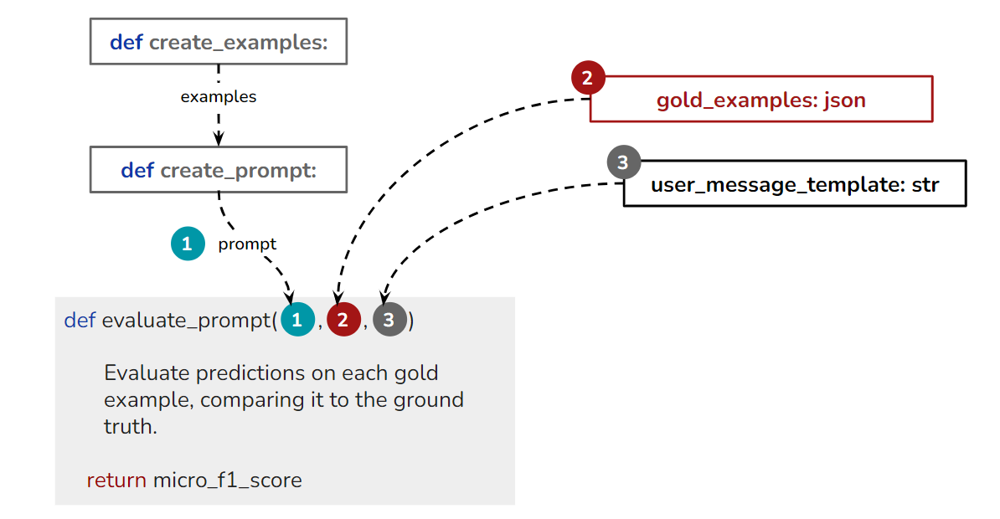

In [189]:
def evaluate_prompt(prompt, gold_examples, user_message_template, model):
    model_predictions, ground_truths = [], []

    for example in json.loads(gold_examples):
        gold_input = example['text']
        user_input = [
            {
                'role':'user',
                'content': user_message_template.format(movie_review=gold_input)
            }
        ]

        try:
            response = model.invoke(
               prompt+user_input
            )
            if hasattr (response, 'content'):
                response_content = response.content
            else:
                response_content = response    
            if 'negative' in response_content.strip().lower():
                prediction='negative'
            elif 'positive' in response_content.strip().lower():
                prediction='positive'
            else:
                prediction ='unknown'
            model_predictions.append(prediction)
            ground_truths.append(example['sentiment'])
            #print(prediction, example['sentiment'])

        except Exception as e:
            print(e)
            continue

    micro_f1_score = f1_score(ground_truths, model_predictions, average="micro")

    return micro_f1_score

Utilisons maintenant cette fonction pour effectuer une évaluation des trois prompts assemblés jusqu’ici, en calculant à chaque fois le score **micro-F1**.

In [190]:
gpt5 = ChatOpenAI(
    model="gpt-5.2", temperature=0
    )

In [191]:
evaluate_prompt(zero_shot_prompt, gold_examples, user_message_template, gpt5)

1.0

In [193]:
evaluate_prompt(few_shot_prompt, gold_examples, user_message_template, gpt5)

1.0

In [195]:
evaluate_prompt(cot_few_shot_prompt, gold_examples, user_message_template, gpt5)

1.0

Cependant, il ne s’agit que d’*un seul* choix d’exemples. Nous devons exécuter ces évaluations avec plusieurs choix d’exemples afin de nous faire une idée de la variabilité du score F1 pour le prompt *few-shot* et le prompt **CoT**. À titre d’exemple, exécutons les évaluations pour le prompt *few-shot* et le prompt **CoT** 10 fois.

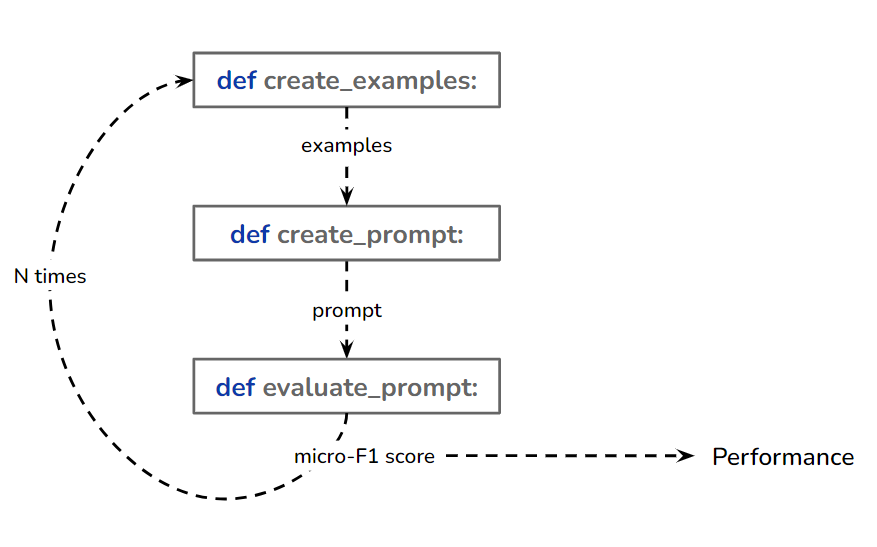

In [197]:
num_eval_runs = 10
few_shot_performance, cot_few_shot_performance = [], []
for _ in tqdm(range(num_eval_runs)):

    # For each run create a new sample of examples
    examples = create_examples(examples_df)

    # Assemble the few shot prompt with these examples
    few_shot_prompt = create_prompt(few_shot_system_message, examples, user_message_template)
    #cot_few_shot_prompt = create_prompt(cot_system_message, examples, user_message_template)

    # Evaluate prompt accuracy on gold examples
    few_shot_micro_f1 = evaluate_prompt(few_shot_prompt, gold_examples, user_message_template, gpt5)
    #cot_few_shot_micro_f1 = evaluate_prompt(cot_few_shot_prompt, gold_examples, user_message_template)

    few_shot_performance.append(few_shot_micro_f1)
    cot_few_shot_performance.append(few_shot_micro_f1)


100%|██████████| 10/10 [02:32<00:00, 15.22s/it]


In [200]:
mean_val =np.array(few_shot_performance).mean()
std_val= np.array(few_shot_performance).std()

In [201]:
print(f"f1_score Moyen= {mean_val}, Standard Deviation = {std_val} ")

f1_score Moyen= 1.0, Standard Deviation = 0.0 
